<a href="https://colab.research.google.com/github/ds-20195/notebooks/blob/main/Notebook8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%config InlineBackend.figure_formats = ["retina"]

In [ ]:
!pip install -q folium scikit-learn census seaborn geopandas us

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 360.5/360.5 kB 6.3 MB/s eta 0:00:00


In [ ]:
!curl -OL https://raw.githubusercontent.com/ds-20195/notebooks/main/notebook_data/Notebook8_mappluto_subset.gpkg.zip
!unzip -o Notebook8_mappluto_subset.gpkg.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 13.0M  100 13.0M    0     0  12.4M      0  0:00:01  0:00:01 --:--:-- 12.4M
Archive:  Notebook8_mappluto_subset.gpkg.zip
  inflating: Notebook8_mappluto_subset.gpkg  


# Data and the State (DATA 20195/30195)
# Lab 8: Evictions and Redlining

In [ ]:
# FILL THIS IN WITH YOUR OWN CENSUS API KEY. You can get one for free at https://api.census.gov/data/key_signup.html
api_key = "fakecode"

In [ ]:
import folium
import folium.plugins
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import seaborn as sns
from branca.utilities import color_brewer
import branca.colormap as cm
from branca.element import Element
import us
import math

from census import Census

In [ ]:
# @markdown The bit of logic in this cell fixes an error caused by the Census changing its API
# @markdown requirement on May 12, 2026. The Census package did not properly pass the API
# @markdown key to all requests, so we have to patch the element that handles that logic.
from functools import lru_cache
from census.core import Client

def _patched_field_type(self, field, year):
    url = self.definition_url % (year, self.dataset, field)
    resp = self.session.get(url, params={"key": self._key})

    type_map = {
        "fips-for": str,
        "fips-in": str,
        "int": float,
        "long": float,
        "float": float,
        "string": str,
    }
    if resp.status_code == 200:
        try:
            predicate_type = resp.json().get("predicateType", "string")
            return type_map.get(predicate_type, str)
        except Exception:
            return str
    return str


# Apply lru_cache and patch onto the base class
Client._field_type = lru_cache(maxsize=1024)(_patched_field_type)

state_fips_to_abbrev = {state.fips: state.abbr for state in us.states.STATES}
state_fips_to_abbrev.update(
    {
        "11": "DC", # DC
        "60": "AS", # American Samoa
        "66": "GU", # Guam
        "69": "MP", # Northern Mariana Islands
        "72": "PR", # Puerto Rico
        "78": "VI", # U.S. Virgin Islands
    }
)

In [ ]:
year = 2018
# this is just to catch blank API keys
if api_key == "":
    raise ValueError("You need to provide a Census API key to run this code. You can get one for free at https://api.census.gov/data/key_signup.html")

census = Census(key=api_key, year=year)

In [ ]:
try:
    census.pl.get(
        ("NAME"),
        geo={"for": "state:17"},
        year=2020
    )
    print("Your request succeeded! The Census API is working with your API key.")
except Exception as e:
    print(f"Your request failed with error: {e}")

Your request failed with error: ' <html style="font-size: 14px;">     <head>         <title>Invalid Key</title>         <link rel="icon" type="image/x-icon" href="favicon.ico">         <link rel="stylesheet" type="text/css" href="assets/styles.css">         <script type="text/javascript" src="assets/jquery-1.4.4.min.js"></script>         <script type="text/javascript">             $(document).ready(function() {                 $(".menu-activator").click(function() {                     $(".gov-menu").toggle()                     $(".chevron").toggleClass(\'rotate\')                 })                             })         </script>     </head>     <body>         <header>             <div data-v-8adc6fed="" data-v-2f72e816="" class="gov-banner noprint">                 <div data-v-8adc6fed="" class="aqua-layout horizontal align-start justify-start banner-header">                                          <span data-v-8adc6fed="">                         <div data-v-8adc6fed="" class="aq

In [ ]:
# @markdown This code cell contains a helper function for our backup data in case of API failure.
import requests
import io
def read_parquet_from_github(url):
    # If there is no geometry data, then you need to read in with pandas or the
    # request will fail because geopandas expects to see a geometry column.
    r = requests.get(url)
    try:
        df = gpd.read_parquet(io.BytesIO(r.content))
    except ValueError:
        df = pd.read_parquet(io.BytesIO(r.content))
    return df

## Eviction Lab dataset

We'll start this week with data from the [Eviction Lab](https://evictionlab.org/) at Princeton, home of Matt Desmond and Peter Hepburn. This data has been assembled and compiled from multiple sources, and more information on the methods they've used can be found [here](https://evictionlab.org/methods/). It is a powerful resource for studying eviction patterns throughout the United States.

To get a sense of what this data looks like interactively, you can explore their [interactive map](https://evictionlab.org/map).

We'll start with data for estimating eviction prevalence.  Each row is a county in a particular year, from 2000 to 2018.

In [ ]:
df_eviction_prev = pd.read_csv(
    "https://eviction-lab-data-downloads.s3.amazonaws.com/estimating-eviction-prevalance-across-us/county_eviction_estimates_2000_2018.csv"
)
df_eviction_prev.head()

,state,county,FIPS_state,FIPS_county,year,renting_hh,filings_estimate,filings_ci_95_lower,filings_ci_95_upper,ind_filings_court_issued,ind_filings_court_issued_LT,hh_threat_estimate,hh_threat_95_lower,hh_threat_95_upper,ind_hht_observed
0,Alabama,Autauga County,1,1001,2000,3074,109,109,109,1,0.0,106,106,106,1
1,Alabama,Autauga County,1,1001,2001,3264,75,75,75,1,0.0,74,71,75,0
2,Alabama,Autauga County,1,1001,2002,3454,94,94,94,1,0.0,92,88,94,0
3,Alabama,Autauga County,1,1001,2003,3644,100,100,100,1,0.0,98,94,100,0
4,Alabama,Autauga County,1,1001,2004,3834,112,112,112,1,0.0,110,106,112,0


In [ ]:
df_eviction_prev.head(25)

,state,county,FIPS_state,FIPS_county,year,renting_hh,filings_estimate,filings_ci_95_lower,filings_ci_95_upper,ind_filings_court_issued,ind_filings_court_issued_LT,hh_threat_estimate,hh_threat_95_lower,hh_threat_95_upper,ind_hht_observed
0,Alabama,Autauga County,1,1001,2000,3074,109,109,109,1,0.0,106,106,106,1
1,Alabama,Autauga County,1,1001,2001,3264,75,75,75,1,0.0,74,71,75,0
2,Alabama,Autauga County,1,1001,2002,3454,94,94,94,1,0.0,92,88,94,0
3,Alabama,Autauga County,1,1001,2003,3644,100,100,100,1,0.0,98,94,100,0
4,Alabama,Autauga County,1,1001,2004,3834,112,112,112,1,0.0,110,106,112,0
5,Alabama,Autauga County,1,1001,2005,4024,95,95,95,1,0.0,94,91,95,0
6,Alabama,Autauga County,1,1001,2006,4213,128,128,128,1,0.0,126,122,128,0
7,Alabama,Autauga County,1,1001,2007,4403,123,123,123,1,0.0,121,116,123,0
8,Alabama,Autauga County,1,1001,2008,4593,137,137,137,1,0.0,134,130,137,0
9,Alabama,Autauga County,1,1001,2009,4783,108,108,108,1,0.0,106,102,108,0


Next we'll calculate three measures that are common in the eviction literature and that the Eviction Lab reports.  These are a little confusing, so read carefully!

* *Rate of filings:* the total number of evictions *filed* per 100 renter-occupied homes in that area for a given year.  Note that this can reflect many filings on one apartment.
* *Households filed on:* the total number of renter-occupied households who ever received an eviction filing in a given year, per 100.
* *Eviction judgment rate:* the number of renters who received an eviction judgment/court order requiring them to leave over all renter-occupied homes in a given year.

So suppose there were 100 apartments in all, and 3 of them were filed on 5 times each, and out of those three, two resulted in a court order.  Then the filing rate would be 15, the number of households filed on would be 3, and the eviction rate would be 2.  So these numbers should be ordered from largest to smallest.

### Modeled vs "Original" (proprietary)

Also notable:  they give two options for what dataset to use, which they call "Modeled" vs. "Original."  The "original" data comes from proprietary sources -- that means they largely bought it, and it's hard to vouch for the quality.  The "modeled" version uses official court data and smooths it out with some statistical tools.

Filing rate and threatened rate are both available from the modeled data.  Let's look at those first.

In [ ]:
df_eviction_prev["filing_pct"] = (
    df_eviction_prev["filings_estimate"] * 100 / df_eviction_prev["renting_hh"]
)
df_eviction_prev["hh_filed_on_pct"] = (
    df_eviction_prev["hh_threat_estimate"] * 100 / df_eviction_prev["renting_hh"]
)

In [ ]:
df_eviction_prev[["filing_pct", "hh_filed_on_pct"]].describe()

,filing_pct,hh_filed_on_pct
count,59717.000000,59717.000000
mean,5.010749,4.174013
std,7.472987,4.620251
min,0.000000,0.000000
25%,1.381999,1.351351
50%,2.810651,2.698651
75%,5.657193,5.190311
max,154.618193,59.569671


So there was some county that had a filing rate over 150 filings per 100 units -- more than one filing per housing unit! -- in a certain year.

Now we'll summarize this information across all 18 years of data. We'll first sum up the number of filings, threatened households and renting households, and then we'll recalculate our rates over those aggregates.

In [ ]:
df_eviction_prev_overall = df_eviction_prev[
    ["state", "county", "FIPS_county", "filings_estimate", "hh_threat_estimate", "renting_hh"]
].groupby(["state", "county", "FIPS_county"]).sum().reset_index()

df_eviction_prev_overall["filing_pct"] = (
    df_eviction_prev_overall["filings_estimate"] * 100 / df_eviction_prev_overall["renting_hh"]
)
df_eviction_prev_overall["hh_filed_on_pct"] = (
    df_eviction_prev_overall["hh_threat_estimate"] * 100 / df_eviction_prev_overall["renting_hh"]
)
df_eviction_prev_overall = df_eviction_prev_overall[
    ["state", "county", "FIPS_county", "renting_hh", "filings_estimate", "filing_pct", "hh_threat_estimate", "hh_filed_on_pct"]
]
df_eviction_prev_overall.set_index("FIPS_county", inplace=True)
df_eviction_prev_overall.head()

,state,county,renting_hh,filings_estimate,filing_pct,hh_threat_estimate,hh_filed_on_pct
FIPS_county,,,,,,,
1001,Alabama,Autauga County,86450,2492,2.882591,2444,2.827068
1003,Alabama,Baldwin County,356720,11869,3.327259,11531,3.232507
1005,Alabama,Barbour County,59900,529,0.883139,529,0.883139
1007,Alabama,Bibb County,35274,522,1.479844,520,1.474174
1009,Alabama,Blount County,76355,1154,1.511361,1140,1.493026


Now we'll get our standard TIGER/Line counties shapefile into a dataframe and inspect the first few rows.

In [ ]:
# load counties shapefiles to map
gdf_counties = gpd.read_file(
    "https://raw.githubusercontent.com/ds-20195/notebooks/main/notebook_data/Notebook8_tl_2018_us_county.zip"
).to_crs(2163)
states = [state_fips_to_abbrev[state] for state in gdf_counties["STATEFP"]]
gdf_counties.insert(0, "STATE", states)
gdf_counties.shape

(3233, 19)

OK, there are 3233 counties or county-equivalents in here.  Next, create unique identifier on Census counties to join with evictions dataframe.

In [ ]:
gdf_counties["county_fips_full"] = (
    gdf_counties["STATEFP"] + gdf_counties["COUNTYFP"]
).astype(int)
gdf_counties.set_index("county_fips_full", inplace=True)

gdf_eviction_filings_overall = gdf_counties[
    ["STATE", "STATEFP", "COUNTYFP", "NAME", "NAMELSAD", "geometry"]
].join(df_eviction_prev_overall, how="left")

Now we'll visualize on the map.  If we set the range to go up to the maximum (which is over 100) then most of the map will be washed out.  So we'll manually set the `vmax`.  This code block sets it at 50, but try lowering that value in both plots and find a level that gives some good visual insight.

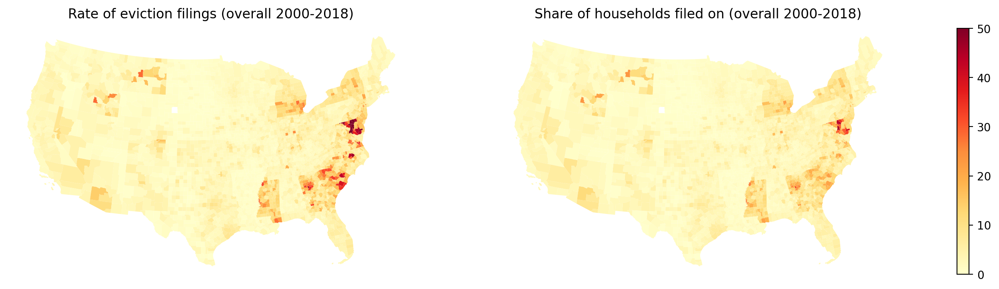

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
# filter out hawaii and alaska for visualization
state_filter = ~gdf_eviction_filings_overall.STATEFP.isin(["15", "02"])
gdf_eviction_filings_overall[state_filter].plot(
    column="filing_pct", ax=axes[0], vmin=0, vmax=50, cmap="YlOrRd", legend=False
)
gdf_eviction_filings_overall[state_filter].plot(
    column="hh_filed_on_pct", ax=axes[1], vmin=0, vmax=50, cmap="YlOrRd", legend=False
)
axes[0].set_title("Rate of eviction filings (overall 2000-2018)")
axes[1].set_title("Share of households filed on (overall 2000-2018)")
axes[0].set_axis_off()
axes[1].set_axis_off()

# assume it's the first (and only) mappable
patch_col = axes[0].collections[0]
cb = fig.colorbar(patch_col, ax=axes, shrink=0.5)

What area had the highest filing rate (and is colored in a dark red in the mid-Atlantic region)?

In [ ]:
gdf_eviction_filings_overall[
    gdf_eviction_filings_overall["filing_pct"]
    == gdf_eviction_filings_overall["filing_pct"].max()
]

,STATE,STATEFP,COUNTYFP,NAME,NAMELSAD,geometry,state,county,renting_hh,filings_estimate,filing_pct,hh_threat_estimate,hh_filed_on_pct
county_fips_full,,,,,,,,,,,,,
24005,MD,24,005,Baltimore,Baltimore County,"POLYGON ((1955260.174 -342141.577, 1955257.421...",Maryland,Baltimore County,2014391.0,2744606.0,136.249914,885086.0,43.938143


We can also look at some of the counties with eviction filing rates > 99th percentile.  Since there were 3233 counties, this picks out the top 32.

In [ ]:
gdf_eviction_filings_overall[
    gdf_eviction_filings_overall["filing_pct"]
    >= gdf_eviction_filings_overall["filing_pct"].quantile(0.99)
].sort_values("filing_pct", ascending=False)

,STATE,STATEFP,COUNTYFP,NAME,NAMELSAD,geometry,state,county,renting_hh,filings_estimate,filing_pct,hh_threat_estimate,hh_filed_on_pct
county_fips_full,,,,,,,,,,,,,
24005,MD,24,005,Baltimore,Baltimore County,"POLYGON ((1955260.174 -342141.577, 1955257.421...",Maryland,Baltimore County,2014391.0,2744606.0,136.249914,885086.0,43.938143
24033,MD,24,033,Prince George's,Prince George's County,"POLYGON ((1964183.368 -398913.172, 1964168.607...",Maryland,Prince George's County,2201214.0,2644531.0,120.139659,998469.0,45.359924
24510,MD,24,510,Baltimore,Baltimore city,"POLYGON ((1971826.798 -345975.085, 1971825.144...",Maryland,Baltimore City,2522676.0,2786282.0,110.449459,1103890.0,43.758691
24045,MD,24,045,Wicomico,Wicomico County,"POLYGON ((2072705.275 -430164.685, 2072319.122...",Maryland,Wicomico County,253920.0,189591.0,74.665643,99849.0,39.323015
24025,MD,24,025,Harford,Harford County,"POLYGON ((1988265.098 -324652.901, 1988253.165...",Maryland,Harford County,361361.0,247483.0,68.486361,126595.0,35.032834
24003,MD,24,003,Anne Arundel,Anne Arundel County,"POLYGON ((1970416.791 -374960.982, 1970424.931...",Maryland,Anne Arundel County,978242.0,627955.0,64.192194,287406.0,29.379847
24027,MD,24,027,Howard,Howard County,"POLYGON ((1948661.073 -368116.611, 1948639.104...",Maryland,Howard County,529348.0,306100.0,57.825854,133662.0,25.250308
24017,MD,24,017,Charles,Charles County,"POLYGON ((1950169.833 -445836.699, 1950169.069...",Maryland,Charles County,209749.0,112368.0,53.572603,61700.0,29.416112
13063,GA,13,063,Clayton,Clayton County,"POLYGON ((1436807.483 -1134446.214, 1436784.17...",Georgia,Clayton County,734928.0,353029.0,48.035862,253199.0,34.452218


And we can compute the difference in filing patterns between 2000 and 2018, to find out what counties experienced the greatest change over time.

In [ ]:
df_eviction_prev.set_index("FIPS_county", inplace=True)
df_eviction_prev_wide = df_eviction_prev[
    df_eviction_prev["year"].isin([2000, 2018])
].pivot(columns="year", values=["hh_filed_on_pct", "filing_pct"])
df_eviction_prev_wide.columns = [
    a[0] + "_" + str(a[1]) for a in df_eviction_prev_wide.columns.to_flat_index()
]
df_eviction_prev_wide["filing_pct_diff"] = (
    df_eviction_prev_wide["filing_pct_2018"]
    - df_eviction_prev_wide["filing_pct_2000"]
)
df_eviction_prev_wide["hh_filed_on_pct_diff"] = (
    df_eviction_prev_wide["hh_filed_on_pct_2018"]
    - df_eviction_prev_wide["hh_filed_on_pct_2000"]
)

gdf_eviction_filings_diff = gdf_counties.join(df_eviction_prev_wide)
gdf_eviction_filings_diff.head()

,STATE,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,...,AWATER,INTPTLAT,INTPTLON,geometry,hh_filed_on_pct_2000,hh_filed_on_pct_2018,filing_pct_2000,filing_pct_2018,filing_pct_diff,hh_filed_on_pct_diff
county_fips_full,,,,,,,,,,,,,,,,,,,,,
31039,NE,31,039,00835841,31039,Cuming,Cuming County,06,H1,G4020,...,10690952,+41.9158651,-096.7885168,"POLYGON ((246290.041 -328619.667, 246286.51 -3...",0.177148,0.424448,0.177148,0.424448,0.247300,0.247300
53069,WA,53,069,01513275,53069,Wahkiakum,Wahkiakum County,06,H1,G4020,...,61588406,+46.2946377,-123.4244583,"POLYGON ((-1770686.984 398793.664, -1771124.91...",0.949367,1.818182,1.265823,1.818182,0.552359,0.868815
35011,NM,35,011,00933054,35011,De Baca,De Baca County,06,H1,G4020,...,29089486,+34.3592729,-104.3686961,"POLYGON ((-422754.447 -1210188.449, -422784.93...",1.477833,2.429150,1.477833,2.429150,0.951317,0.951317
31109,NE,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,...,22832516,+40.7835474,-096.6886584,"POLYGON ((260193.977 -463717.021, 260172 -4631...",3.260454,3.390461,3.495165,3.643536,0.148371,0.130008
31129,NE,31,129,00835886,31129,Nuckolls,Nuckolls County,06,H1,G4020,...,1718484,+40.1764918,-098.0468422,"POLYGON ((146978.459 -544334.301, 146978.432 -...",0.000000,0.179856,0.000000,0.179856,0.179856,0.179856


Now we can visualize where the rates rose and where they fell.  One good thing to think about for data like this is the [colormap](https://matplotlib.org/stable/users/explain/colors/colormaps.html).  So far we've been using a **sequential** colormap `YlOrRd`, which goes from yellow to orange to red.  But it's worth seeing how the map changes when you use a **divergent** colormap like `PuOr`.  

### TASK:  Mapping choices

Toggle between sequential and divergent, and mess with range of values plotted, until the map tells a story.

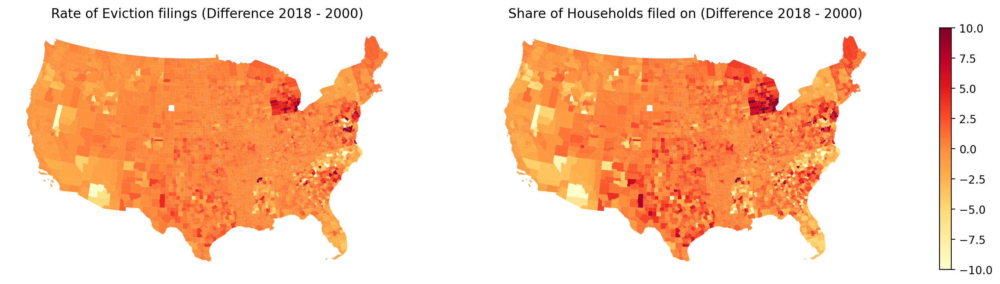

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
# filter out hawaii and alaska for visualization
state_filter = ~gdf_eviction_filings_diff.STATEFP.isin(["15", "02"])
gdf_eviction_filings_diff[state_filter].plot(
    column="filing_pct_diff",
    ax=axes[0],
    vmin=-10,
    vmax=10,
    cmap="YlOrRd",
    legend=False,
)
gdf_eviction_filings_diff[state_filter].plot(
    column="hh_filed_on_pct_diff",
    ax=axes[1],
    vmin=-5,
    vmax=5,
    cmap="YlOrRd",
    legend=False,
)
axes[0].set_title("Rate of Eviction filings (Difference 2018 - 2000)")
axes[1].set_title("Share of Households filed on (Difference 2018 - 2000)")
axes[0].set_axis_off()
axes[1].set_axis_off()

# assume it's the first (and only) mappable
patch_col = axes[0].collections[0]
cb = fig.colorbar(patch_col, ax=axes, shrink=0.5)

### DISCUSSION: Policy traces on the map

Some of the patterns hold for whole states and some show variation below the state level.  What might be some policy correlates of the patterns?

### Exploring proprietary data

Now we'll explore the **proprietary** data. The Eviction Lab shares this data on their map, but they note that proprietary data has limited coverage and there may be data quality issues. Additionally, these rates have already been produced without denominators, so we'll need to link back to the modeled data to get estimates of renting households.

In [ ]:
df_proprietary = pd.read_csv(
    "https://eviction-lab-data-downloads.s3.amazonaws.com/estimating-eviction-prevalance-across-us/county_proprietary_2000_2018.csv"
)
df_proprietary.rename(
  columns={
    "filing_rate": "filing_pct",
    "threatened": "hh_filed_on",
    "threatened_rate": "hh_filed_on_pct",
    "judgement_rate": "judgement_pct"
  },
  inplace=True
)
df_proprietary.head()

,id,name,parent_location,year,type,filings,filing_pct,hh_filed_on,hh_filed_on_pct,judgements,judgement_pct
0,1001,Autauga County,Alabama,2000,observed,57.0,1.85,54.0,1.76,35.0,1.14
1,1001,Autauga County,Alabama,2001,observed,84.0,2.73,83.0,2.70,35.0,1.14
2,1001,Autauga County,Alabama,2002,observed,100.0,3.25,97.0,3.16,20.0,0.65
3,1001,Autauga County,Alabama,2003,observed,102.0,3.32,90.0,2.93,12.0,0.39
4,1001,Autauga County,Alabama,2004,observed,19.0,0.62,19.0,0.62,12.0,0.39


We're going to use the dataframe operation `merge` — this is almost the same as `join` but a bit more flexible about how to use the left vs. right dataframes.  We're using merge here so we can join on multiple columns:  to match, you need to match on both.  (We pull three columns and match on two.)

In [ ]:
renting_only_df_prev = df_eviction_prev.reset_index()[["FIPS_county", "year", "renting_hh"]]

# merge/join only where fips and year match
df_proprietary_overall = df_proprietary.merge(
    renting_only_df_prev,
    left_on=["id", "year"],
    right_on = ["FIPS_county", "year"]
).groupby("id")

df_proprietary_overall = df_proprietary_overall[["filings", "hh_filed_on", "judgements", "renting_hh"]].sum()

df_proprietary_overall["filing_pct"] = (
    df_proprietary_overall["filings"] * 100 / df_proprietary_overall["renting_hh"]
)
df_proprietary_overall["hh_filed_on_pct"] = (
    df_proprietary_overall["hh_filed_on"] * 100 / df_proprietary_overall["renting_hh"]
)
df_proprietary_overall["judgement_pct"] = (
    df_proprietary_overall["judgements"] * 100 / df_proprietary_overall["renting_hh"]
)
df_proprietary_overall.head()

,filings,hh_filed_on,judgements,renting_hh,filing_pct,hh_filed_on_pct,judgement_pct
id,,,,,,,
1001,2009.0,1903.0,1108.0,86450,2.323887,2.201272,1.281666
1003,10054.0,9739.0,5602.0,356720,2.818457,2.730153,1.570419
1005,481.0,474.0,263.0,59900,0.803005,0.791319,0.439065
1007,314.0,309.0,174.0,35274,0.890174,0.875999,0.493281
1009,1025.0,1008.0,730.0,76355,1.342414,1.320149,0.956061


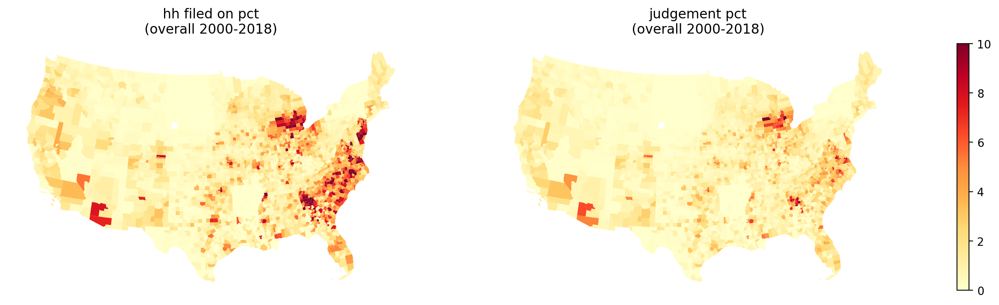

In [ ]:
gdf_proprietary = gdf_counties.join(df_proprietary_overall, how="left")

fig, axes = plt.subplots(1, 2, figsize=(18, 8))
# filter out hawaii and alaska for visualization
for i, col in enumerate(["hh_filed_on_pct", "judgement_pct"]):
    state_filter = ~gdf_proprietary.STATEFP.isin(["15", "02"])
    gdf_proprietary[state_filter].plot(
        column=col,
        vmax=10,
        ax=axes[i],
        cmap="YlOrRd",
        legend=False,
    )

    axes[i].set_title(f"{col.replace('_',' ')}\n(overall 2000-2018)")
    axes[i].set_axis_off()

patch_col = axes[0].collections[0]
cb = fig.colorbar(patch_col, ax=axes, shrink=0.5)

Please note that there are a lot of states suspiciously underrepresented in the data coverage!  This includes the Dakotas, Arkansas, Vermont, and New York.  

Let's try comparing the modeled data to the proprietary data. It looks like the proprietary data might be undercounting the eviction filing rates and threatened rates.

### TASK: Investigate coverage

Explore the data.  Any states with no values at all?  any states with positive numbers in a few counties but zero in most?  etc.


In [ ]:
# YOUR CODE HERE

# Ask for help if you get stuck!

Let's try comparing the modeled data to the proprietary data. It looks like the modeled data might be doing a lot of work to fill in low rates.

In [ ]:
df_eviction_mgd = df_eviction_prev.reset_index().merge(
    df_proprietary,
    left_on=["FIPS_county", "year"],
    right_on=["id", "year"],
    suffixes=["_modeled", "_proprietary"],
)

For example, what's happening in Baltimore county?  Let's compare the filing rates in the two ways Eviction Lab provides them.

In [ ]:
df_eviction_mgd[df_eviction_mgd["FIPS_county"] == 24005][
    ["year", "filing_pct_modeled", "filing_pct_proprietary"]
]

,year,filing_pct_modeled,filing_pct_proprietary
22724,2000,121.373512,0.03
22725,2001,118.785111,0.19
22726,2002,125.663771,0.02
22727,2003,122.091880,0.02
22728,2004,123.634952,0.04
22729,2005,125.206232,0.35
22730,2006,131.876556,0.63
22731,2007,140.623602,2.02
22732,2008,141.270577,71.71
22733,2009,154.618193,21.37


This proprietary data gives a **huge** undercount compared to their modeling!  (i.e., they're heavily relying on statistical smoothing to make the data look plausible)

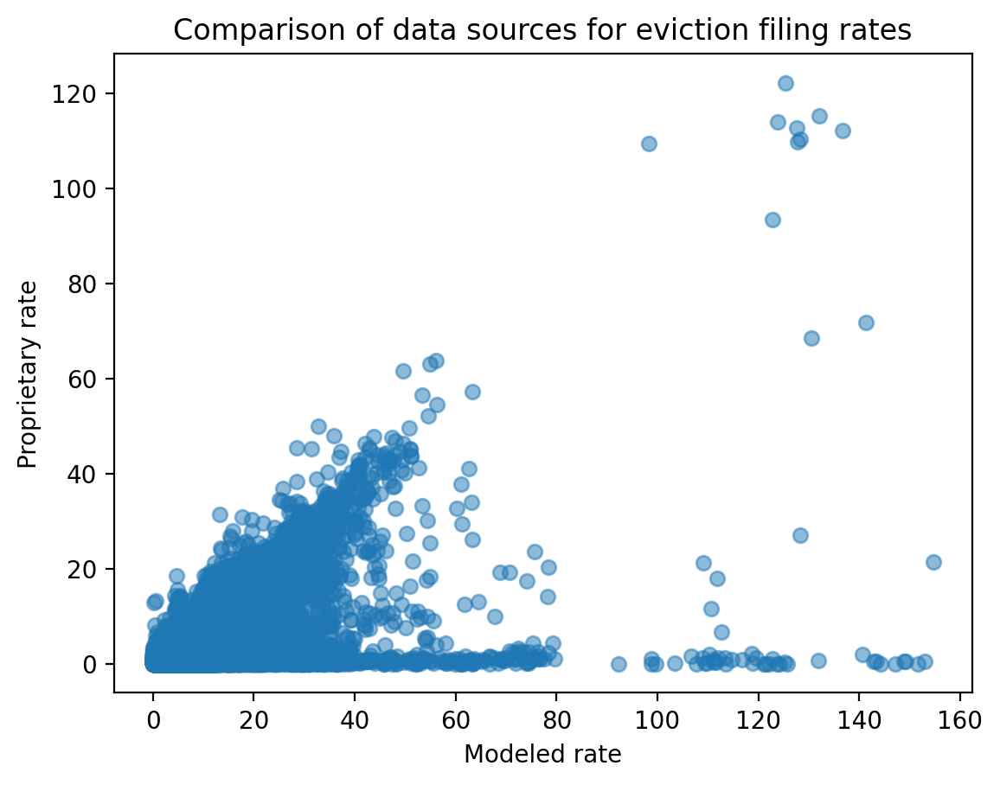

In [ ]:
plt.scatter(
    df_eviction_mgd["filing_pct_modeled"],
    df_eviction_mgd["filing_pct_proprietary"],
    alpha=0.5,
)
plt.xlabel("Modeled rate")
plt.ylabel("Proprietary rate")
plt.title("Comparison of data sources for eviction filing rates")
plt.show()

### DISCUSSION: Utility of smoothing

It seems pretty clear that the "modeled" data changes the picture substantially.  This has pros and cons, of course! Discuss the advantages of smoothing over anomalies in the data, and talk about how to do so responsibly.

## Comparison to Census Data

To get race and socioeconomic variables (like rental prices) into the story, we'll need to load county-level ACS data.

In [ ]:
acs_cols = [
    "B02001_001E",
    "B02001_002E",
    "B02001_003E",
    "B02001_004E",
    "B02001_005E",
    "B02001_006E",
    "B02001_007E",
    "B02001_008E",
    "B03002_012E",
    "B25038_001E",
    "B25038_009E",
    "B25031_001E",
]
acs_colnames = [
    "totalpop",
    "white",
    "black",
    "aian",
    "asian",
    "nhpi",
    "other",
    "multi",
    "hispanic_latino",
    "totalhh",
    "renters",
    "median_gross_rent",
]

In [ ]:
# @markdown This cell grabs the data for the above columns from the ACS,
# @markdown renames them, and adds percent columns. The result is stored
# @markdown in the dataframe `county_acs_df`.
try:
    county_acs_df = pd.DataFrame(
        census.acs5.get(
            tuple(acs_cols),
            geo={
                "for": "county:*",
                "in": "state:*",
            },
        )
    )
except Exception:
    county_acs_df = read_parquet_from_github(
        "https://github.com/ds-20195/notebooks/raw/refs/heads/main/notebook_data/Notebook8_county_acs_df.parquet",
    )


county_acs_df_clean = county_acs_df.rename(
    columns={x: y for x, y in zip(acs_cols, acs_colnames)}
)
county_acs_df_clean["GEOID10"] = (
    county_acs_df_clean["state"] + county_acs_df_clean["county"]
).astype(int)
county_acs_df_clean.rename(columns={"state": "STATEFP", "county": "COUNTYFP"},inplace=True)
county_acs_df_clean.set_index("GEOID10", inplace=True)
county_acs_df_clean.head()

county_acs_df_clean["renters_pct"] = (
    100 * county_acs_df_clean["renters"] / county_acs_df_clean["totalhh"]
)

race_eth_cols = [
    "white",
    "black",
    "aian",
    "asian",
    "nhpi",
    "other",
    "multi",
    "hispanic_latino",
]
for col in race_eth_cols:
    county_acs_df_clean[col + "_pct"] = (
        100 * county_acs_df_clean[col] / county_acs_df_clean["totalpop"]
    )

In [ ]:
county_acs_df_clean

,totalpop,white,black,aian,asian,nhpi,other,multi,hispanic_latino,totalhh,...,COUNTYFP,renters_pct,white_pct,black_pct,aian_pct,asian_pct,nhpi_pct,other_pct,multi_pct,hispanic_latino_pct
GEOID10,,,,,,,,,,,,,,,,,,,,,
20173,512064.0,400828.0,45888.0,5077.0,22209.0,226.0,16451.0,21385.0,73527.0,195779.0,...,173,36.370091,78.276934,8.961380,0.991478,4.337153,0.044135,3.212684,4.176236,14.358947
20157,4686.0,4576.0,16.0,17.0,30.0,0.0,0.0,47.0,87.0,2248.0,...,157,25.578292,97.652582,0.341443,0.362783,0.640205,0.000000,0.000000,1.002988,1.856594
20065,2545.0,2319.0,100.0,5.0,25.0,0.0,0.0,96.0,77.0,1216.0,...,065,20.641447,91.119843,3.929273,0.196464,0.982318,0.000000,0.000000,3.772102,3.025540
20045,119319.0,98478.0,5047.0,2935.0,6229.0,27.0,1337.0,5266.0,7356.0,46294.0,...,045,48.155269,82.533377,4.229838,2.459793,5.220459,0.022628,1.120526,4.413379,6.164986
20179,2506.0,2456.0,11.0,5.0,0.0,0.0,25.0,9.0,120.0,1134.0,...,179,26.278660,98.004789,0.438947,0.199521,0.000000,0.000000,0.997606,0.359138,4.788508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16003,4019.0,3852.0,11.0,50.0,0.0,8.0,4.0,94.0,141.0,1675.0,...,003,19.402985,95.844737,0.273700,1.244091,0.000000,0.199054,0.099527,2.338890,3.508335
16053,23431.0,22059.0,29.0,113.0,129.0,83.0,605.0,413.0,8299.0,7828.0,...,053,36.088401,94.144509,0.123768,0.482267,0.550553,0.354232,2.582049,1.762622,35.418890
16061,3845.0,3352.0,9.0,280.0,54.0,1.0,27.0,122.0,171.0,1632.0,...,061,28.492647,87.178153,0.234070,7.282185,1.404421,0.026008,0.702211,3.172952,4.447334


Let's merge on the Census ACS data.

In [ ]:
gdf_eviction_filings_demo = gdf_eviction_filings_overall.reset_index().merge(
    county_acs_df_clean.reset_index(),
    left_on=["county_fips_full", "STATEFP", "COUNTYFP"],
    right_on=["GEOID10", "STATEFP", "COUNTYFP"],
)

# let's also set sentinel values for median gross rent
gdf_eviction_filings_demo["median_gross_rent"] = np.where(
    gdf_eviction_filings_demo["median_gross_rent"] < 0,
    np.nan,
    gdf_eviction_filings_demo["median_gross_rent"],
)


As a first glimpse, we'll make a heatmap-style correlation matrix.

Text(0.5, 1.0, 'County-level correlations: eviction filings and demographics')

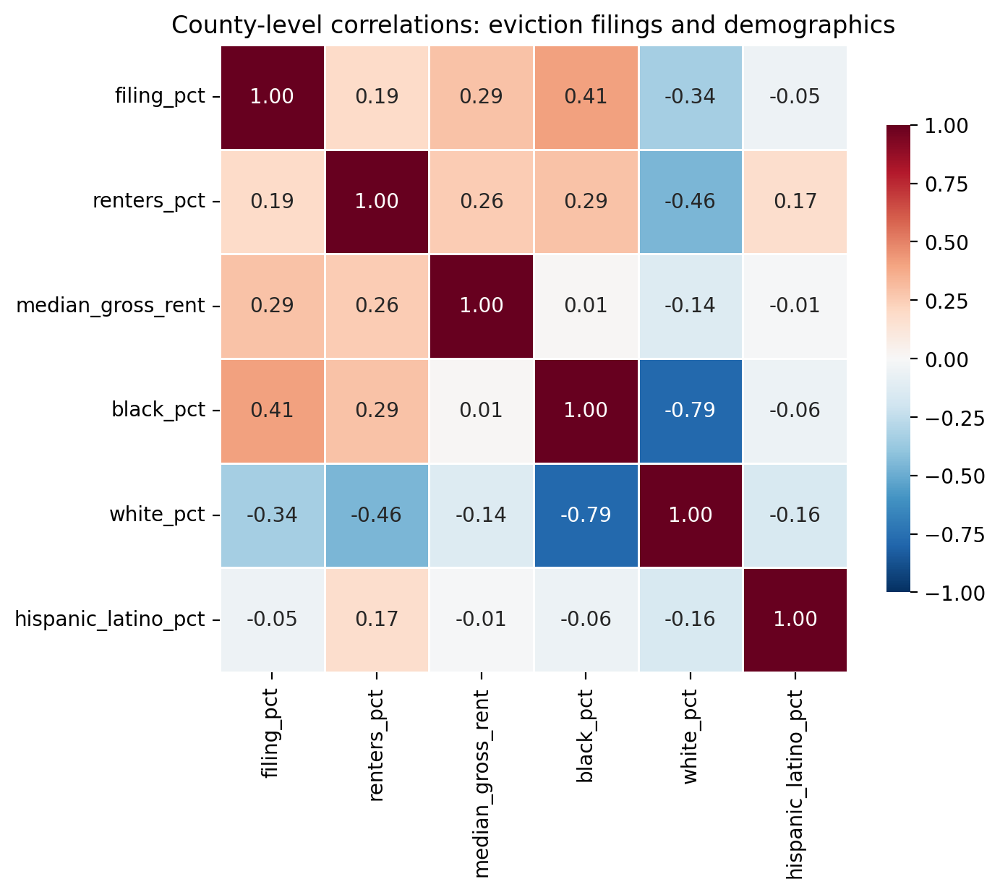

In [ ]:
cols = ["filing_pct", "renters_pct", "median_gross_rent",
        "black_pct", "white_pct", "hispanic_latino_pct"]
corr = gdf_eviction_filings_demo[cols].corr()

fig, ax = plt.subplots(figsize=(7, 6))
sns.heatmap(
    corr,
    annot=True, fmt=".2f",
    cmap="RdBu_r", vmin=-1, vmax=1, center=0,
    square=True, linewidths=0.5,
    cbar_kws={"shrink": 0.7},
    ax=ax,
)
ax.set_title("County-level correlations: eviction filings and demographics")

### DISCUSSION: Eviction correlations

There are many notable cells of this matrix, some of them surprising.  What do you see?  What could use more investigation?

## Eviction Data: NYC Open Data

The Eviction Lab provides a comprehensive resource on evictions, but it's not the only resource on evictions. We can also use local data. For example, New York City publishes an [Open Data set](https://data.cityofnewyork.us/City-Government/Evictions/6z8x-wfk4/about_data) on *executed* evictions (that go through the court system and result in physical removal). This is building-level data on evictions going back to 2017.

This is a messy process. For example, the New York State OCA Data Collective receives housing court filings data from the state Office of Court Administration and shares this with local organizations like the [Housing Data Coalition](https://www.housingdatanyc.org/). The OCA Data Collective includes organizations like the Right to Counsel Coalition, BetaNYC, the Association for Neighborhood and Housing Development, the University Neighborhood Housing Program, and JustFix. It is also affiliated with the Housing Data Coalition (HDC). Together, these groups help to make local, deidentified eviction *filing* data available for New York City, often to support tenant advocacy groups and to fight predatory landlords.

We'll first load a subset of [MapPLUTO](https://www.nyc.gov/content/planning/pages/resources?search=pluto#datasets), which is the New York City Department of City Planning's geospatial tax lot data. PLUTO stands for the primary land use tax output.

A helpful feature of local data from NYC is the use of a borough-block-lot (`BBL`) identifier, which uniquely identifies every parcel in the city. This makes it very easy to join tabular data (i.e., eviction data) to geospatial data (i.e., parcel data), and allows us to avoid geocoding ourselves.  Note: for ease of loading the data, we'll load a geopackage containing only a subset of parcels that we know will join to our eviction data.

In [ ]:
# tax lots data from MapPLUTO
mppluto = gpd.read_file("Notebook8_mappluto_subset.gpkg")
mppluto.head()

,BBL,OwnerType,LandUse,UnitsTotal,UnitsRes,AssessLand,AssessTot,ExemptTot,YearBuilt,geometry
0,1.000078e+09,None,04,43.0,42.0,1741500.0,6970950.0,0.0,1880.0,"MULTIPOLYGON (((981311.209 195510.668, 981240...."
1,1.000100e+09,None,05,97.0,0.0,6930000.0,30483900.0,0.0,1930.0,"MULTIPOLYGON (((980867.809 195627.081, 980872...."
2,1.000118e+09,None,04,4.0,3.0,363150.0,3464190.0,0.0,1900.0,"MULTIPOLYGON (((980911.184 195813.831, 980911...."
3,1.000160e+09,X,05,6.0,0.0,52420950.0,350676450.0,350676450.0,2009.0,"MULTIPOLYGON (((980392.176 199856.826, 980381...."
4,1.000200e+09,None,05,71.0,0.0,11340000.0,32468850.0,0.0,1983.0,"MULTIPOLYGON (((980678.427 196676.025, 980634...."


Now we'll load our eviction data from NYC Open Data.

In [ ]:
df_nyc_evictions = pd.read_csv(
    "https://data.cityofnewyork.us/resource/6z8x-wfk4.csv?$limit=1000000"
)

df_nyc_evictions.head()

,court_index_number,docket_number,eviction_address,eviction_apt_num,executed_date,marshal_first_name,marshal_last_name,residential_commercial_ind,borough,eviction_zip,ejectment,eviction_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta
0,323578/23A,124166,1140-1150 ANDERSON A VENUE,A-21,2024-10-01T00:00:00.000,Justin,Grossman,Residential,BRONX,10452,Not an Ejectment,Possession,40.835606,-73.924605,4.0,16.0,199.0,2003069.0,2.025050e+09,Highbridge
1,K93173/16,75476,339 48TH STREET,2,2017-06-13T00:00:00.000,Ileana,Rivera,Residential,BROOKLYN,11220,Not an Ejectment,Possession,40.648257,-74.012497,7.0,38.0,80.0,3012197.0,3.007640e+09,Sunset Park West
2,57462/18,205579,1655 FLATBUSH AVENUE,C1210,2018-10-17T00:00:00.000,Richard,Capuano,Residential,BROOKLYN,11210,Not an Ejectment,Possession,40.630096,-73.944757,18.0,45.0,776.0,3206459.0,3.075790e+09,Flatlands
3,K303363/23,415018,1620 FULTON STREET,5D ALL ROOMS,2023-12-04T00:00:00.000,Richard,McCoy,Residential,BROOKLYN,11213,Not an Ejectment,Possession,40.679648,-73.936048,3.0,36.0,271.0,3000000.0,3.016990e+09,Crown Heights North
4,328454/24,36854,1212 UNIVERSITY AVE,3-D,2025-09-09T00:00:00.000,Gary,Rose,Residential,BRONX,10452,Not an Ejectment,Possession,40.838281,-73.927269,4.0,16.0,199.0,2116375.0,2.025280e+09,Highbridge


The eviction data has some duplicates (entire rows of data that are duplicated), some instances of multiple rows for the same address on the same day, and missing BBLs. We'll clean things up here in a naive way,  but in a more comprehensive analysis, you could dive deeper, e.g., by geocoding missing BBLs yourself using a tool from NYC Department of City Planning [Geoclient](https://maps.nyc.gov/geoclient/v1/doc).

In [ ]:
# Drop duplicate rows
df_nyc_evictions = df_nyc_evictions.drop_duplicates()

# Reformat the date to remove time
df_nyc_evictions.loc[:,'executed_date_only'] = pd.to_datetime(df_nyc_evictions.loc[:,'executed_date'])

# Keep only unique rows over the given subset of columns. Default to first appearance
df_nyc_evictions_dedup = df_nyc_evictions.drop_duplicates(
    subset=[
      'eviction_address', 'eviction_apt_num', 'marshal_first_name', 'marshal_last_name',
      'residential_commercial_ind', 'borough', 'eviction_zip', 'ejectment', 'eviction_possession',
      'latitude', 'longitude', 'community_board', 'council_district', 'census_tract', 'bin', 'bbl','nta',
      'executed_date_only'
    ],
    keep='first'
)

# merge on BBL
nyc_evictions_pluto = mppluto[
    [
        "BBL",
        "OwnerType",
        "LandUse",
        "UnitsTotal",
        "UnitsRes",
        "AssessLand",
        "AssessTot",
        "ExemptTot",
        "YearBuilt",
        "geometry",
    ]
].merge(df_nyc_evictions_dedup, left_on="BBL", right_on="bbl")

# create a version that's point data using centroid
nyc_evictions_pluto_centroid = nyc_evictions_pluto.copy()
nyc_evictions_pluto_centroid["geometry"] = nyc_evictions_pluto_centroid[
    "geometry"
].centroid

# create a building-level version: aggregate by BBL, then re-merge
building_eviction_count = (
    nyc_evictions_pluto.value_counts("BBL")
    .reset_index()
    .rename(columns={"count": "total_num_evictions"})
)
nyc_evictions_count_pluto = mppluto[
    [
        "BBL",
        "OwnerType",
        "LandUse",
        "UnitsTotal",
        "UnitsRes",
        "AssessLand",
        "AssessTot",
        "ExemptTot",
        "YearBuilt",
        "geometry",
    ]
].merge(building_eviction_count, on="BBL")
nyc_evictions_pluto.head()

,BBL,OwnerType,LandUse,UnitsTotal,UnitsRes,AssessLand,AssessTot,ExemptTot,YearBuilt,geometry,...,eviction_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta,executed_date_only
0,1.000078e+09,None,04,43.0,42.0,1741500.0,6970950.0,0.0,1880.0,"MULTIPOLYGON (((981311.209 195510.668, 981240....",...,Possession,40.703611,-74.010932,1.0,1.0,9.0,1077806.0,1.000078e+09,Battery Park City-Lower Manhattan,2023-05-25
1,1.000078e+09,None,04,43.0,42.0,1741500.0,6970950.0,0.0,1880.0,"MULTIPOLYGON (((981311.209 195510.668, 981240....",...,Possession,40.703611,-74.010932,1.0,1.0,9.0,1077806.0,1.000078e+09,Battery Park City-Lower Manhattan,2018-05-24
2,1.000100e+09,None,05,97.0,0.0,6930000.0,30483900.0,0.0,1930.0,"MULTIPOLYGON (((980867.809 195627.081, 980872....",...,Possession,40.703954,-74.011592,1.0,1.0,9.0,1000025.0,1.000100e+09,Battery Park City-Lower Manhattan,2026-01-22
3,1.000100e+09,None,05,97.0,0.0,6930000.0,30483900.0,0.0,1930.0,"MULTIPOLYGON (((980867.809 195627.081, 980872....",...,Possession,40.703954,-74.011592,1.0,1.0,9.0,1000025.0,1.000100e+09,Battery Park City-Lower Manhattan,2025-02-27
4,1.000118e+09,None,04,4.0,3.0,363150.0,3464190.0,0.0,1900.0,"MULTIPOLYGON (((980911.184 195813.831, 980911....",...,Possession,40.704034,-74.012068,1.0,1.0,9.0,1000040.0,1.000118e+09,Battery Park City-Lower Manhattan,2017-07-18


Putting all the processing together, we can now see the total number of evictions per building.  We'll have the number of residences (e.g, apartments) in one column, and the number of evictions in the other.

There are mysteries here, like why there are evictions on non-residential buildings, and it would take more work to figure this out fully.

In [ ]:
nyc_evictions_count_pluto[["UnitsTotal", "UnitsRes", "total_num_evictions"]]

,UnitsTotal,UnitsRes,total_num_evictions
0,43.0,42.0,2
1,97.0,0.0,2
2,4.0,3.0,1
3,6.0,0.0,1
4,71.0,0.0,4
...,...,...,...
40531,1.0,1.0,1
40532,2.0,2.0,1
40533,2.0,2.0,1
40534,2.0,2.0,2


In [ ]:
# let's build a vector with a row per BBL where the entries are evictions per unit
nyc_evictions_count_pluto["evictions_per_unit"] = (
    nyc_evictions_count_pluto["total_num_evictions"] / nyc_evictions_count_pluto["UnitsTotal"]
)
nyc_evictions_count_pluto["evictions_per_unit"] = np.where(
    nyc_evictions_count_pluto["UnitsTotal"] == 0,
    np.nan,
    nyc_evictions_count_pluto["evictions_per_unit"],
)

print("median is",nyc_evictions_count_pluto["evictions_per_unit"].median(),"evictions per unit")

print("maximum is",nyc_evictions_count_pluto["evictions_per_unit"].max(),"evictions per unit")

median is 0.2 evictions per unit
maximum is 38.0 evictions per unit


We'll cut off at 1 eviction per unit, and we'll size points based on the number of residential units (which drops BBLs that have none). We'll also use the building centroids for plotting locations.

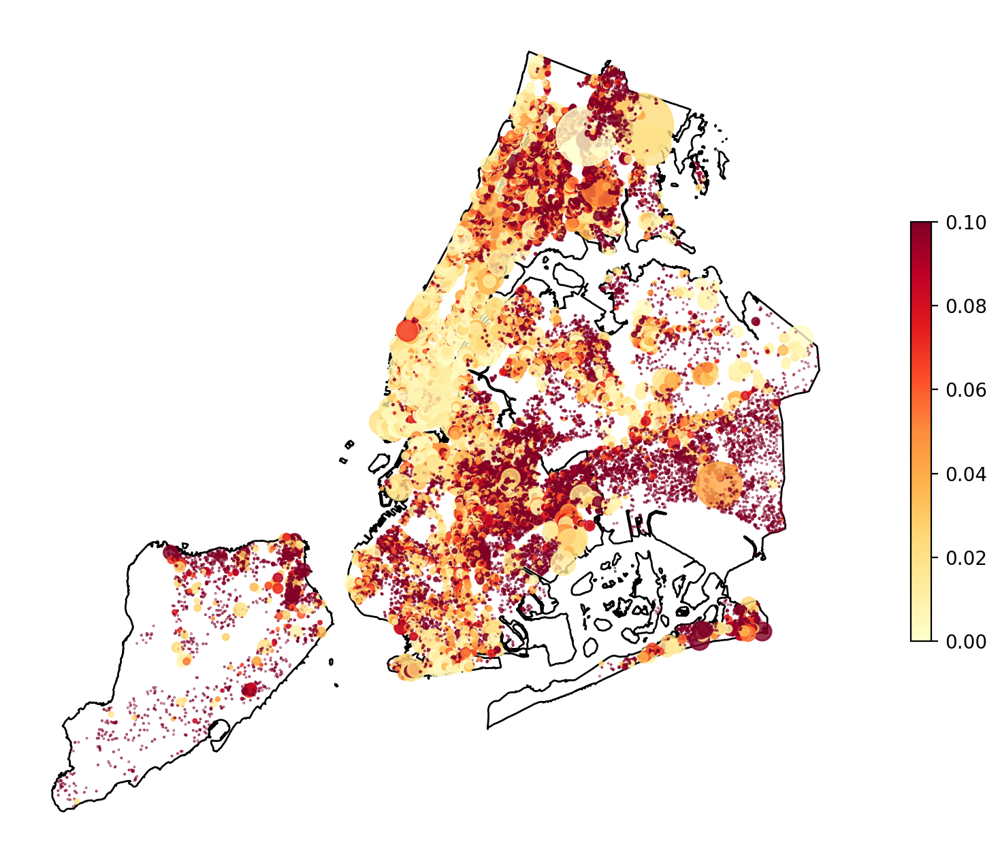

In [ ]:
boros = read_parquet_from_github(
  "https://raw.githubusercontent.com/ds-20195/notebooks/main/notebook_data/Notebook8_NYC_boros.parquet"
).to_crs(2263)

nyc_evictions_count_pluto["geometry"] = nyc_evictions_count_pluto["geometry"].centroid

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
boros.plot(ax=ax, facecolor="none")
filtered_data = nyc_evictions_count_pluto[
    nyc_evictions_count_pluto["evictions_per_unit"]  <= 1
]

filtered_data.plot(
    ax=ax,
    column="evictions_per_unit",
    markersize=filtered_data["UnitsRes"]/10,
    vmin=0,
    vmax=0.1,
    alpha=0.8,
    legend=True,
    cmap="YlOrRd",
    legend_kwds={"shrink": 0.4},
)
ax.set_title("Building-level eviction rates, NYC (2017–present)")
ax.set_axis_off()

## NCRC Redlining Dataset

We're working with data collected by Helen Meier and Bruce Mitchell and available in an [NCRC repo](https://www.openicpsr.org/openicpsr/project/141121/version/V3/view?path=/openicpsr/141121/fcr:versions/V3.2&type=project). Meier and Mitchell compiled data from what's called the Historical Redlining Indicator (HRI) onto census tracts.  A paper about the methods can be found [here](https://ncrc.org/redlining-score/).

The historical data comes from from the Home Owners' Loan Corporation (HOLC) -- the U.S. federal agency that graded mortgage investment risk of neighborhoods across the U.S. between 1935 and 1940. For HOLC, a grade of "A" indicates low risk. In the processed data, each HOLC risk category is assigned a numeric score (1 for “A” grade, and so on) and then each tract's score is gotten by an areal proration from the HOLC zones.

There's a column called `RHRI2020`, which is just the rounded HRI score (to one decimal place).

NOTE: the canonical source for redlining data is an extraordinary University of Richmond project on redlining called [Mapping Inequality](https://dsl.richmond.edu/panorama/redlining/).  You should absolutely check out their stuff and click around.  We've emphasized the NCRC data here because the NYC coverage is better and we'll use that below.

In [ ]:
def plot_hri(
    gdf,
    center,
    zoom,
    key="GEOID20",
    column="HRI2020",
    cmap="RdYlGn_r",
    tiles="OpenStreetMap",
):
    hri_map = folium.Map(center, zoom_start=zoom, tiles=tiles)

    choro = folium.Choropleth(
        geo_data=gdf,
        name="choropleth",
        data=gdf,
        columns=[key, column],
        key_on=f"feature.properties.{key}",
        fill_color=cmap,
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name="Historic Redlining Indicator",
        bins = [1.,1.5,2,2.5,3,3.5,4,4.5]
    )

    # Add tooltip directly to the choropleth's geojson child so we can read the
    # scores when hovering
    choro.geojson.add_child(
        folium.GeoJsonTooltip(
            fields=[key, column],
            aliases=["Census Tract:", "HRI Score:"],
            localize=True,
        )
    )

    choro.add_to(hri_map)

    # Add a background to the color bar so you can read the text
    css = """
    <style>
    .legend.leaflet-control {
        background: rgba(255, 255, 255, 0.85);
        padding: 6px 8px;
        border-radius: 4px;
        box-shadow: 0 1px 4px rgba(0,0,0,0.3);
    }
    </style>
    """
    hri_map.get_root().html.add_child(Element(css))
    return hri_map

In [ ]:
hri_gdf = gpd.read_file("https://raw.githubusercontent.com/ds-20195/notebooks/refs/heads/main/notebook_data/HRI2020.zip")

Let's see the choropleth for the tract-level HRI score for NYC.  Red areas correspond to HRI score of 4, which is a deisgnation of high risk so it was hard or impossible to get a loan for many years.

In [ ]:
nyc_metro_area = hri_gdf[hri_gdf["METRO_NAME"] == "New York-Newark-Jersey City, N"].copy()

plot_hri(nyc_metro_area, [40.65, -73.95], 12, "GEOID20", "HRI2020")

I wonder if these align with eviction data...?

Plotting may take a minute or two.

In [ ]:
# @markdown This cell contains some helper functions to make plotting
# @markdown the next folium map easier.

def cmap_to_hex(cmap_name, n=6):
    """Sample n evenly spaced colors from a matplotlib colormap as hex strings."""
    cmap = plt.get_cmap(cmap_name)
    return [mcolors.to_hex(cmap(i)) for i in np.linspace(0, 1, n)]


def build_eviction_layer(
    gdf,
    eviction_col="evictions_per_unit",
    size_column="UnitsRes",
    size_scale=0.4,
    vmax=0.1,
    cmap_name="YlOrRd",
    n_colors=6,
):
    evictions_latlong = gdf.to_crs("EPSG:4326")


    eviction_cmap = cm.LinearColormap(
        cmap_to_hex(cmap_name, n=n_colors),
        vmin=0,
        vmax=vmax,
        caption="Eviction Rate (per building)",
    )

    eviction_layer = folium.FeatureGroup(name="Eviction Rate")
    for _, row in evictions_latlong.iterrows():
        rate = row[eviction_col]
        units = max(row[size_column], 1)  # guard against 0/NaN
        radius_px = size_scale * math.sqrt(units)

        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=radius_px,
            color=eviction_cmap(rate),
            weight=0,
            fill=True,
            fill_color=eviction_cmap(rate),
            fill_opacity=0.8,
            tooltip=f"Eviction rate: {rate:.4f}, Units: {int(units)}",
        ).add_to(eviction_layer)

    return eviction_layer, eviction_cmap

In [ ]:
# Blues and CartoDB dark_matter chosen for higher contrast
hri_map = plot_hri(
    nyc_metro_area,
    [40.65, -73.95],
    12,
    "GEOID20",
    "HRI2020",
    cmap="Blues",
    tiles="CartoDB dark_matter"
)

filtered_evictions = nyc_evictions_count_pluto[
    nyc_evictions_count_pluto["evictions_per_unit"]
    <= nyc_evictions_count_pluto["evictions_per_unit"].quantile(0.95)
]
eviction_layer, eviction_cmap = build_eviction_layer(
    filtered_evictions,
    eviction_col="evictions_per_unit",
    cmap_name="YlOrRd",
)

eviction_cmap.add_to(hri_map)
eviction_layer.add_to(hri_map)


hri_map

### DISCUSSION:  Evictions vs. Redlining Index

The patterns are by no means perfect in this overlay, but there's a lot to see, especially if you zoom.  Discuss!

# Homework 8

**Warmup problem:**

(beginner): Which tract in the dataset has the most total evictions, and what was its HRI score?

(advanced): Choose a census tract with an HRI score of 4.0.  In what year did that tract have the most evictions?

**Data product:** Open-ended this week.  We've shown you a wealth of interesting information in these datasets.  Pose a research question and address it with a data product of your choice.  (Note that the HRI data has broad-based national coverage.)

**Reading response:** This week's reading is a chapter from Kenneth Jackson's book on suburbanization, focused on the HOLC and FHA. He assembles his argument from many concrete citations: government officials, agency manuals (especially the FHA Underwriting Manual), congressional debate, contemporary critics, internal HOLC and FHA records. Choose one quote he cited and discuss what persuasive work it does that Jackson couldn't do in his own voice.

